In [57]:
import mne
import pandas as pd
import numpy as np
import statsmodels.api as sm
from matplotlib import pyplot as plt
from stormdb.access import Query
from pickle import load
from scipy import stats
from mne.datasets import sample
from mne.stats import spatio_temporal_cluster_1samp_test
import os
from os import path as op
import pickle
from copy import deepcopy
import warnings
import src.group_stats as gs
import src.decoding_functions as df
import importlib
importlib.reload(gs)
importlib.reload(df)
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [4]:
# Set directories
project = 'MINDLAB2020_MEG-AuditoryPatternRecognition'
project_dir = '/projects/' + project
stats_dir = project_dir + '/scratch/working_memory/results/stats/'
figures_dir = project_dir + '/scratch/working_memory/results/figures/'
dem_file = project_dir + '/misc/WM_demographics.csv'

In [58]:
subs = np.arange(11,91) 
exclude = np.array([15,30,32,33,51,55,60,63,73,82])
probs, betas, events, times, delays, codes = gs.load_predicted_proba(subs, exclude)

loading subject 11
loading subject 12
could not load subject 0012_VK2
[Errno 2] No such file or directory: '/projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scratch/working_memory/averages/data/0012_VK2/0012_VK2_predicted_proba.p'
loading subject 13
loading subject 14
loading subject 16
loading subject 17
loading subject 18
loading subject 19
loading subject 20
could not load subject 0020_RGF
[Errno 2] No such file or directory: '/projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scratch/working_memory/averages/data/0020_RGF/0020_RGF_predicted_proba.p'
loading subject 21
loading subject 22
loading subject 23
could not load subject 0023_ZPC
[Errno 2] No such file or directory: '/projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scratch/working_memory/averages/data/0023_ZPC/0023_ZPC_predicted_proba.p'
loading subject 24
loading subject 25
loading subject 26
loading subject 27
loading subject 28
loading subject 29
loading subject 31
loading subject 34
loading subject 35
loading su

In [60]:
 smean, sstd, sci_lower, sci_upper, smedian, siqr_lower, siqr_upper = gs.grand_avg_scores(probs)

In [83]:
times['maintenance']['maintenance']

array([1.75, 1.76, 1.77, 1.78, 1.79, 1.8 , 1.81, 1.82, 1.83, 1.84, 1.85,
       1.86, 1.87, 1.88, 1.89, 1.9 , 1.91, 1.92, 1.93, 1.94, 1.95, 1.96,
       1.97, 1.98, 1.99, 2.  , 2.01, 2.02, 2.03, 2.04, 2.05, 2.06, 2.07,
       2.08, 2.09, 2.1 , 2.11, 2.12, 2.13, 2.14, 2.15, 2.16, 2.17, 2.18,
       2.19, 2.2 , 2.21, 2.22, 2.23, 2.24, 2.25, 2.26, 2.27, 2.28, 2.29,
       2.3 , 2.31, 2.32, 2.33, 2.34, 2.35, 2.36, 2.37, 2.38, 2.39, 2.4 ,
       2.41, 2.42, 2.43, 2.44, 2.45, 2.46, 2.47, 2.48, 2.49, 2.5 , 2.51,
       2.52, 2.53, 2.54, 2.55, 2.56, 2.57, 2.58, 2.59, 2.6 , 2.61, 2.62,
       2.63, 2.64, 2.65, 2.66, 2.67, 2.68, 2.69, 2.7 , 2.71, 2.72, 2.73,
       2.74, 2.75, 2.76, 2.77, 2.78, 2.79, 2.8 , 2.81, 2.82, 2.83, 2.84,
       2.85, 2.86, 2.87, 2.88, 2.89, 2.9 , 2.91, 2.92, 2.93, 2.94, 2.95,
       2.96, 2.97, 2.98, 2.99, 3.  , 3.01, 3.02, 3.03, 3.04, 3.05, 3.06,
       3.07, 3.08, 3.09, 3.1 , 3.11, 3.12, 3.13, 3.14, 3.15, 3.16, 3.17,
       3.18, 3.19, 3.2 , 3.21, 3.22, 3.23, 3.24, 3.

In [73]:
mel_events = {'mel1': [11,12,13,31,32,33], 'mel2': [21,22,23,41,42,43]}
event_sel = {b: {m: np.where([a in mel_events[m] for a in events[b]])[0] for m in ['mel1','mel2']} for b in probs}


block: maintenance
block: manipulation
block: maintenance
block: manipulation


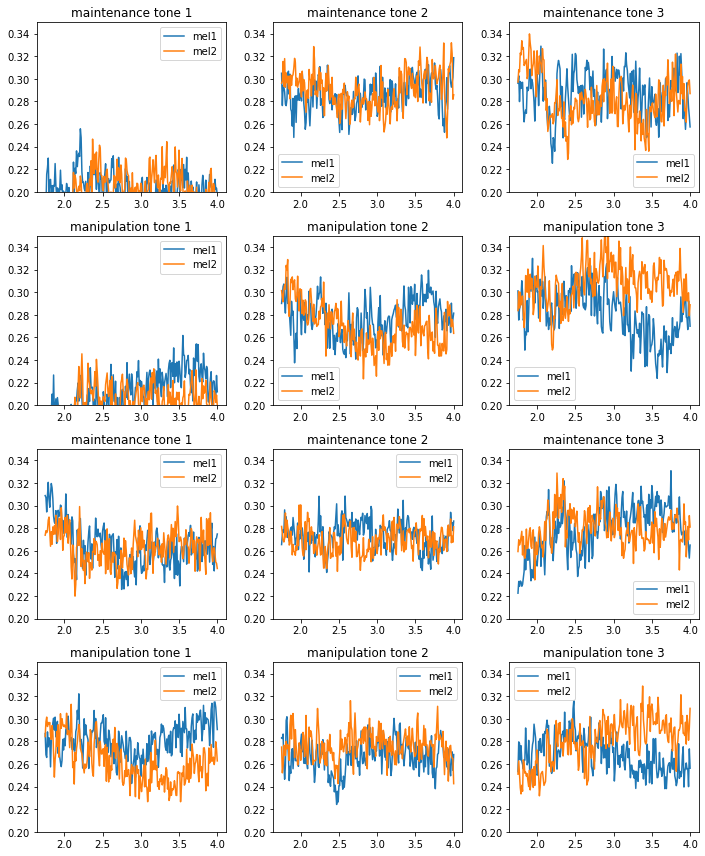

In [96]:
fig, ax = plt.subplots(4,3, figsize=(10,12))
for ctx in range(probs['maintenance'].shape[0]):
    for bix, b in enumerate(probs):
        print('block: '+ b)
        for t in range(probs[b].shape[3]):
            cbix = 2*ctx + bix  
            ax[cbix,t].plot(times[b][b],np.median(probs[b][ctx,event_sel[b]['mel1'],:,t],0))
            ax[cbix,t].plot(times[b][b],np.median(probs[b][ctx,event_sel[b]['mel2'],:,t],0))
#             ax[cbix,t].plot(times[b][b],np.median(probs[b][ctx,event_sel[b]['mel1'],:,t],0) - 
#                                         np.median(probs[b][ctx,event_sel[b]['mel2'],:,t],0))
            ax[cbix,t].set_ylim([0.2,.35])
            ax[cbix,t].set_title(b + ' ' + 'tone ' + str(t+1))
            ax[cbix,t].legend(['mel1','mel2'])
plt.tight_layout()
#plt.savefig(fig_dir + sub + '_probs_timecourses.pdf')

In [6]:
CI = {ss: {'lower': sci_lower[ss], 'upper': sci_upper[ss]} for ss in sci_lower}

In [7]:
FDR_stats = {s: gs.do_stats(np.diff(probs[s],axis),'FDR',h0 = 1/2) for s in sdata}
masks     = {sm: FDR_stats[sm]['mask'] for sm in FDR_stats}


Performing FDR correction

25603

Performing FDR correction

26024

Performing FDR correction

25975

Performing FDR correction

25162


/projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scripts/working_memory/src/decoding_functions.py:219: UserWarning: No contour levels were found within the data range.
  cax.contour(masks[s].copy().astype('float'), levels=[-.1,1], colors='k',


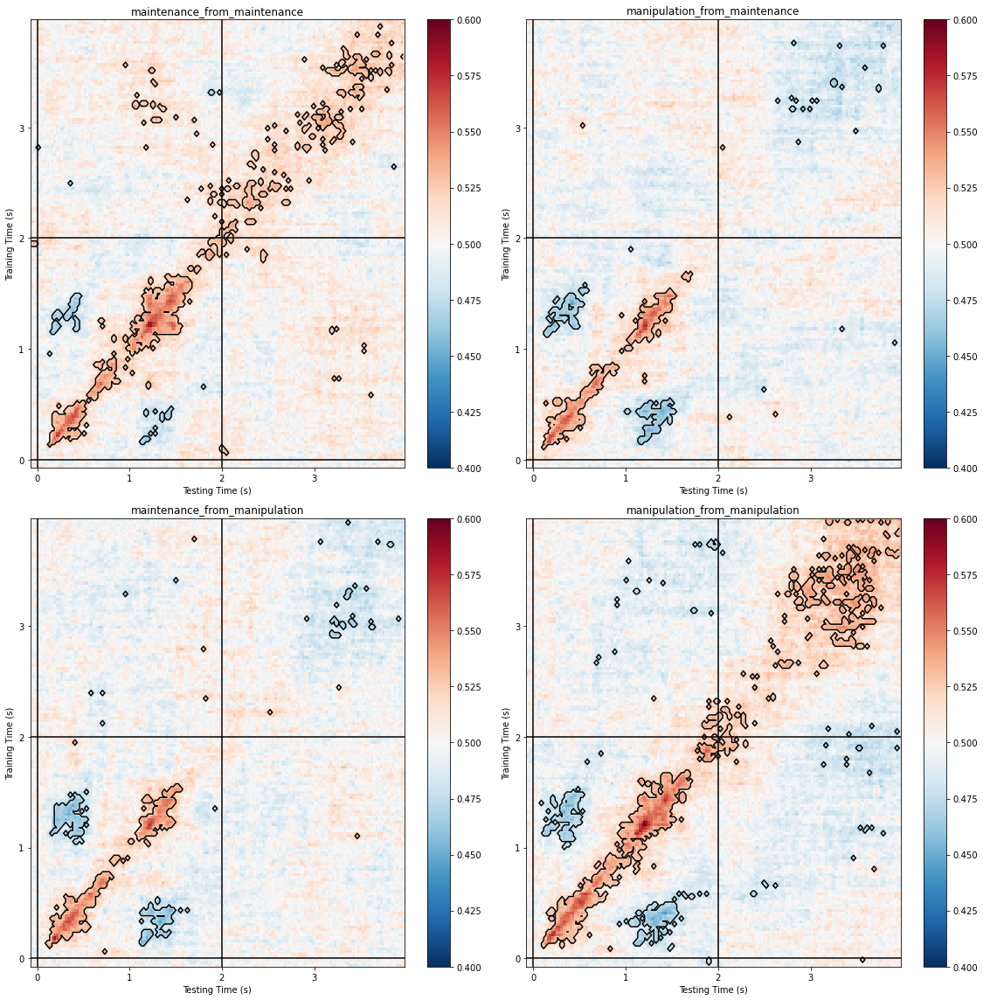

In [8]:
df.plot_time_gen_accuracy(smean, times,  masks = masks,
                          nrows=2, ncols=2, vlines=[2], hlines=[2],
                          savefig=None, vmin=.4,vmax=.6)

In [9]:
cluster_stats = {}
for s in sdata:
    print('doing stats for {}'.format(s))
    cluster_stats[s] = gs.do_stats(sdata[s],method='montecarlo',h0=1/2,n_permutations=1000)

doing stats for maintenance_from_maintenance
Clustering.
stat_fun(H1): min=-5.016098 max=8.917553
Running initial clustering
Found 819 clusters
Permuting 999 times...


  0%|          |  : 0/999 [00:00<?,       ?it/s]

Computing cluster p-values
Done.
doing stats for manipulation_from_maintenance
Clustering.
stat_fun(H1): min=-7.300630 max=8.180628
Running initial clustering
Found 739 clusters
Permuting 999 times...


  0%|          |  : 0/999 [00:00<?,       ?it/s]

Computing cluster p-values
Done.
doing stats for maintenance_from_manipulation
Clustering.
stat_fun(H1): min=-6.554492 max=10.010291
Running initial clustering
Found 760 clusters
Permuting 999 times...


  0%|          |  : 0/999 [00:00<?,       ?it/s]

Computing cluster p-values
Done.
doing stats for manipulation_from_manipulation
Clustering.
stat_fun(H1): min=-6.786557 max=9.235732
Running initial clustering
Found 778 clusters
Permuting 999 times...


  0%|          |  : 0/999 [00:00<?,       ?it/s]

Computing cluster p-values
Done.


In [10]:
cluster_masks = {sm: cluster_stats[sm]['mask'] for sm in cluster_stats}

/projects/MINDLAB2020_MEG-AuditoryPatternRecognition/scripts/working_memory/src/decoding_functions.py:219: UserWarning: No contour levels were found within the data range.
  cax.contour(masks[s].copy().astype('float'), levels=[-.1,1], colors='k',


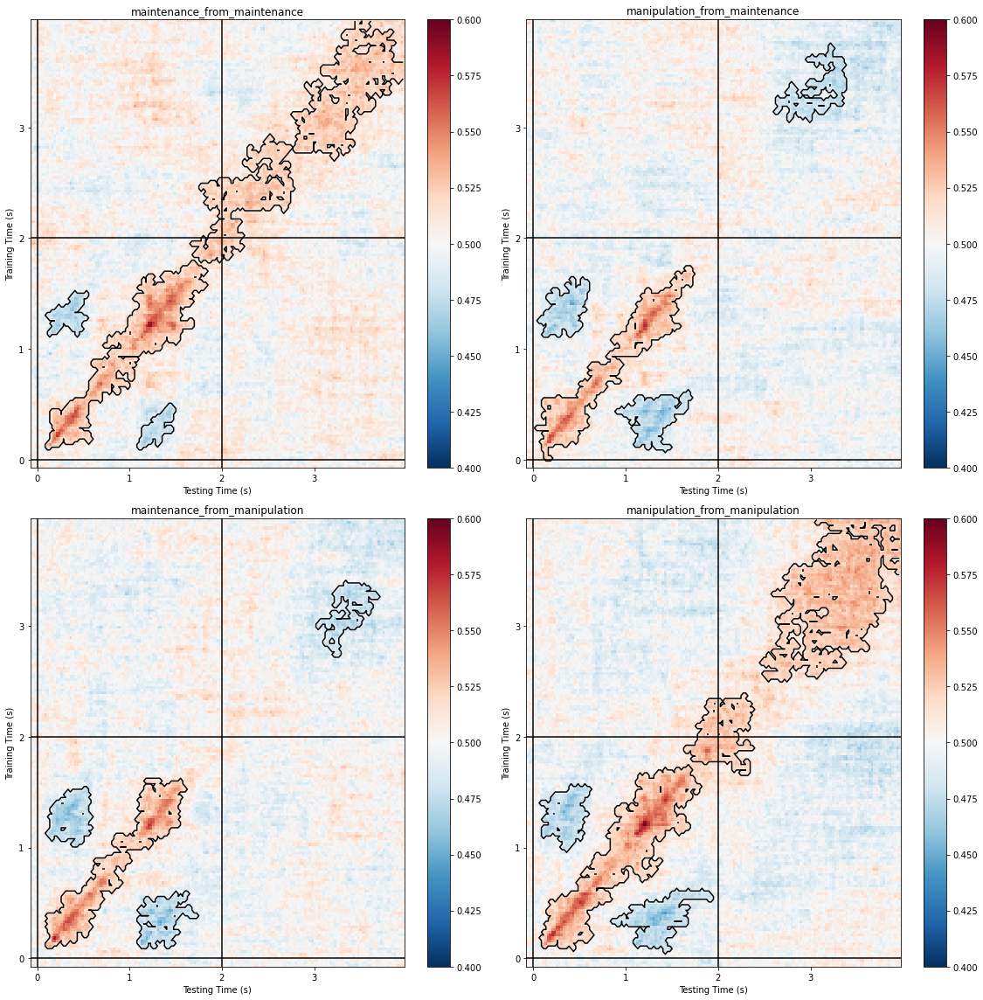

In [11]:
df.plot_time_gen_accuracy(smean, times,  masks = cluster_masks,
                          nrows=2, ncols=2, vlines=[2], hlines=[2],
                          savefig=None, vmin=.4,vmax=.6)

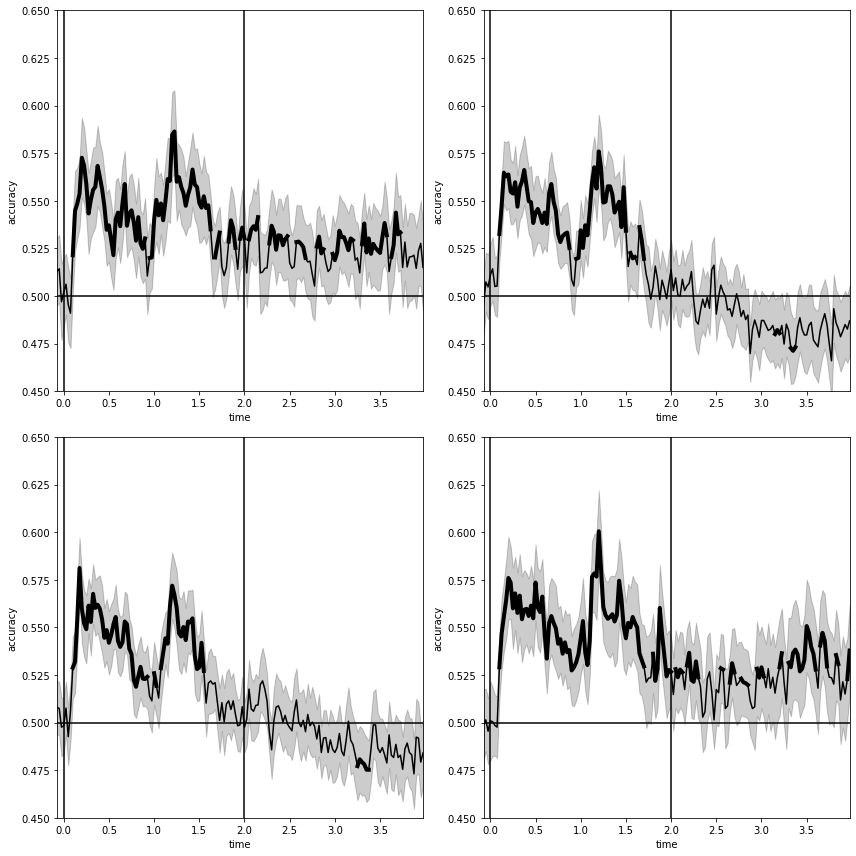

In [13]:
df.plot_diagonal_accuracy(smean, times,  masks = cluster_masks, CI=CI,
                          nrows=2, ncols=2, vlines=[2], hlines=[],
                          savefig=None, ylims=(.45,.65), chance=1/2)

In [16]:
# load demographics
dem = pd.read_csv(dem_file)
dem = dem[np.isin(dem['Subject'],scodes)]
print(dem)

    Subject   Age Sex  vividness difficulty previous  musicianship  yomt   WM  \
0        11  24.0   F        3.0          3       No           1.0  16.0  110   
1        12  31.0   F        1.0          0      Yes           0.0   NaN   88   
2        13  21.0   F        NaN          1      NaN           0.0   NaN   88   
3        14  28.0   M        NaN          3      NaN           0.0   NaN   93   
5        16  25.0   F        NaN          1       No           0.0   NaN   90   
..      ...   ...  ..        ...        ...      ...           ...   ...  ...   
75       86  27.0   F        1.0          1      Yes           0.0   NaN   76   
76       87  32.0   M        NaN        NaN      NaN           NaN   NaN   88   
77       88  18.0   F        1.0         -1       No           0.0   NaN  102   
78       89  20.0   F        2.0          2       No           1.0   7.0  102   
79       90  36.0   F       -2.0          3       No           0.0   NaN   93   

    GMSI  TrainingGMSI  
0 

In [45]:
cluster_reg_stats = {}
#preds = np.array([dem['vividness']]).T
preds = np.array([dem['WM']]).T
for s in sdata:
    print('doing stats for {}'.format(s))
    cdata = np.array(sdata[s].copy()) - 1/2
    cluster_reg_stats[s] = gs.do_regression(sdata[s], preds = preds, n_permutations=500)

doing stats for maintenance_from_maintenance
threshold:  1.9949454146328136
Clustering.
stat_fun(H1): min=-41.684015 max=37.587668
Running initial clustering
Found 1713 clusters
Permuting 499 times...


  0%|          |  : 0/499 [00:00<?,       ?it/s]

Computing cluster p-values
Done.
doing stats for manipulation_from_maintenance
threshold:  1.9949454146328136
Clustering.
stat_fun(H1): min=-32.354009 max=38.212314
Running initial clustering
Found 1739 clusters
Permuting 499 times...


  0%|          |  : 0/499 [00:00<?,       ?it/s]

Computing cluster p-values
Done.
doing stats for maintenance_from_manipulation
threshold:  1.9949454146328136
Clustering.
stat_fun(H1): min=-32.493637 max=39.273282
Running initial clustering
Found 1758 clusters
Permuting 499 times...


  0%|          |  : 0/499 [00:00<?,       ?it/s]

Computing cluster p-values
Done.
doing stats for manipulation_from_manipulation
threshold:  1.9949454146328136
Clustering.
stat_fun(H1): min=-35.740879 max=40.280683
Running initial clustering
Found 1645 clusters
Permuting 499 times...


  0%|          |  : 0/499 [00:00<?,       ?it/s]

Computing cluster p-values
Done.


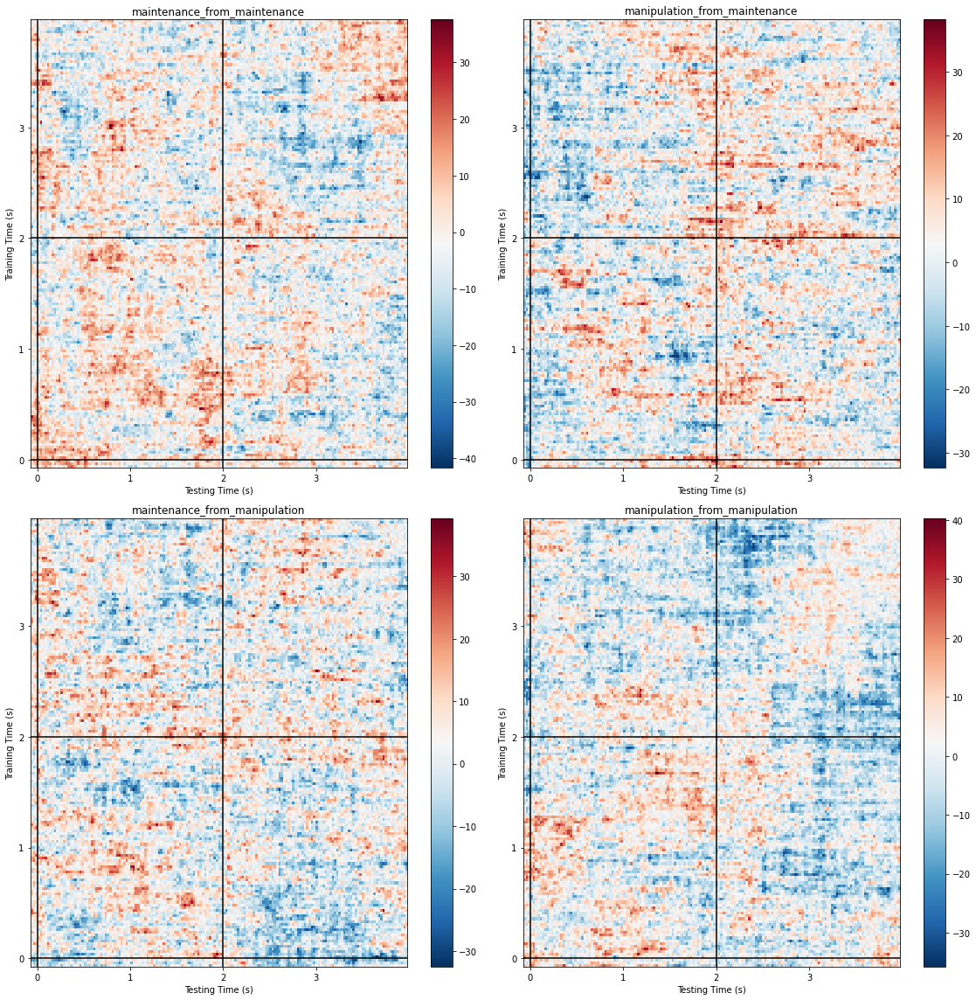

In [39]:
ctvals = {s: cluster_reg_stats[s]['tvals'] for s in cluster_reg_stats}
cmasks = {s: cluster_reg_stats[s]['mask'] for s in cluster_reg_stats}
df.plot_time_gen_accuracy(ctvals, times,  masks = cmasks,
                          nrows=2, ncols=2, vlines=[2], hlines=[2],
                          savefig=None, vmin=None,vmax=None)

In [37]:
np.max(cluster_reg_stats['manipulation_from_manipulation']['tvals'])

40.280683126300325

In [ ]:
# # Compute linear regression
# betas, rval, reg_pvals, ci, aic = {},{},{},{},{}
# preds = np.array([dem['vividness'],dem['musicianship']]).T
# preds = sm.add_constant(preds)
# print(preds.shape)
# for s in sdata:
#     cdata = np.array(sdata[s].copy()) - 1/2
#     xshape = cdata.shape[1]
#     yshape = cdata.shape[2]
#     betas[s] = np.zeros((preds.shape[1],xshape,yshape))
#     rval[s] = np.zeros((xshape,yshape))
#     aic[s] = np.zeros((xshape,yshape))
#     reg_pvals[s] = np.zeros((preds.shape[1],xshape,yshape))
#     #ci[s] = np.zeros(betas[s].shape)
#     for y in range(yshape):
#         for x in range(xshape):
#             print('regressing condition {} training sample: {}/{}, testing sample: {}/{}'.format(s,x+1,xshape,y+1,yshape))
#             res = sm.OLS(cdata[:,x,y],preds,missing='drop').fit()
#             betas[s][:,x,y] = res.params
#             reg_pvals[s][:,x,y] = res.pvalues
#             rval[s][x,y] = res.rsquared
#             aic[s][x,y] = res.aic

In [46]:
# compute correlations with vividness
pvals = {}
cors = {}
for s in sdata:
    sdata[s] = np.array(sdata[s])
    xshape = sdata[s].shape[1]
    yshape = sdata[s].shape[2]
    cors[s] = np.zeros((xshape,yshape))
    pvals[s] = np.zeros((xshape,yshape))
    for y in range(yshape):
        for x in range(xshape):
            print('correlating condition {} training sample: {}/{}, testing sample: {}/{}'.format(s,x,xshape,y,yshape))
            nanix = np.isnan(np.array(dem['vividness'])) == False
            #print(nanix)
#             cur_cor = np.array(pd.DataFrame({'a': sdata[s][:,x,y], 'b': np.array(dem['vividness'])}).corr())[0,1]
#             print(cur_cor)
            cors[s][x,y], pvals[s][x,y] = stats.pearsonr(sdata[s][nanix,x,y], np.array(dem['WM'][nanix]))                   

correlating condition maintenance_from_maintenance training sample: 0/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 1/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 2/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 3/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 4/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 6/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 7/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 0/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 0/163
correlating condition maintena

correlating condition maintenance_from_maintenance training sample: 113/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 114/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 115/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 116/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 117/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 118/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 119/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 120/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 121/163, testing sample: 2/163
correlating condition maintenance_from_maintenance training sample: 122/163, testing sample: 2/163
correlatin

correlating condition maintenance_from_maintenance training sample: 38/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 39/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 40/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 41/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 42/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 43/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 44/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 45/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 46/163, testing sample: 6/163
correlating condition maintenance_from_maintenance training sample: 47/163, testing sample: 6/163
correlating conditio

correlating condition maintenance_from_maintenance training sample: 59/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 60/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 61/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 62/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 63/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 64/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 65/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 66/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 67/163, testing sample: 8/163
correlating condition maintenance_from_maintenance training sample: 68/163, testing sample: 8/163
correlating conditio

correlating condition maintenance_from_maintenance training sample: 95/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 96/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 98/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 99/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 100/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 11/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 11/163
corre

correlating condition maintenance_from_maintenance training sample: 13/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 14/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 15/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 16/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 17/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 18/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 19/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 20/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 21/163, testing sample: 14/163
correlating condition maintenance_from_maintenance training sample: 22/163, testing sample: 14/163
correlatin

correlating condition maintenance_from_maintenance training sample: 106/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 107/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 108/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 109/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 110/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 111/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 112/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 113/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 114/163, testing sample: 16/163
correlating condition maintenance_from_maintenance training sample: 115/163, testing sample: 16/163


correlating condition maintenance_from_maintenance training sample: 42/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 43/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 44/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 45/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 46/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 47/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 48/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 49/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 50/163, testing sample: 19/163
correlating condition maintenance_from_maintenance training sample: 51/163, testing sample: 19/163
correlatin

correlating condition maintenance_from_maintenance training sample: 158/163, testing sample: 21/163
correlating condition maintenance_from_maintenance training sample: 159/163, testing sample: 21/163
correlating condition maintenance_from_maintenance training sample: 160/163, testing sample: 21/163
correlating condition maintenance_from_maintenance training sample: 161/163, testing sample: 21/163
correlating condition maintenance_from_maintenance training sample: 162/163, testing sample: 21/163
correlating condition maintenance_from_maintenance training sample: 0/163, testing sample: 22/163
correlating condition maintenance_from_maintenance training sample: 1/163, testing sample: 22/163
correlating condition maintenance_from_maintenance training sample: 2/163, testing sample: 22/163
correlating condition maintenance_from_maintenance training sample: 3/163, testing sample: 22/163
correlating condition maintenance_from_maintenance training sample: 4/163, testing sample: 22/163
correlatin

correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 98/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 99/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 100/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 105/163, testing sample: 24/163
correlating condition maintenance_from_maintenance training sample: 106/163, testing sample: 24/163
cor

correlating condition maintenance_from_maintenance training sample: 139/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 140/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 141/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 142/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 143/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 144/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 145/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 146/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 147/163, testing sample: 28/163
correlating condition maintenance_from_maintenance training sample: 148/163, testing sample: 28/163


correlating condition maintenance_from_maintenance training sample: 125/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 126/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 127/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 128/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 129/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 130/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 131/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 132/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 133/163, testing sample: 31/163
correlating condition maintenance_from_maintenance training sample: 134/163, testing sample: 31/163


correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 6/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 7/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 10/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 11/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 12/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 13/163, testing sample: 37/163
correlating condition maintenance_from_maintenance training sample: 14/163, testing sample: 37/163
correlating con

correlating condition maintenance_from_maintenance training sample: 80/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 81/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 82/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 83/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 84/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 85/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 86/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 87/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 88/163, testing sample: 40/163
correlating condition maintenance_from_maintenance training sample: 89/163, testing sample: 40/163
correlatin

correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 105/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 106/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 107/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 108/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 109/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 110/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 111/163, testing sample: 43/163
correlating condition maintenance_from_maintenance training sample: 112/163, testing sample: 43/163


correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 98/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 99/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 100/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 105/163, testing sample: 45/163
correlating condition maintenance_from_maintenance training sample: 106/163, testing sample: 45/163
cor

correlating condition maintenance_from_maintenance training sample: 96/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 98/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 99/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 100/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 48/163
correlating condition maintenance_from_maintenance training sample: 105/163, testing sample: 48/163
corr

correlating condition maintenance_from_maintenance training sample: 155/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 156/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 157/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 158/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 159/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 160/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 161/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 162/163, testing sample: 53/163
correlating condition maintenance_from_maintenance training sample: 0/163, testing sample: 54/163
correlating condition maintenance_from_maintenance training sample: 1/163, testing sample: 54/163
corr

correlating condition maintenance_from_maintenance training sample: 93/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 94/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 95/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 96/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 98/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 99/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 100/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 56/163
correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 56/163
correla

correlating condition maintenance_from_maintenance training sample: 159/163, testing sample: 58/163
correlating condition maintenance_from_maintenance training sample: 160/163, testing sample: 58/163
correlating condition maintenance_from_maintenance training sample: 161/163, testing sample: 58/163
correlating condition maintenance_from_maintenance training sample: 162/163, testing sample: 58/163
correlating condition maintenance_from_maintenance training sample: 0/163, testing sample: 59/163
correlating condition maintenance_from_maintenance training sample: 1/163, testing sample: 59/163
correlating condition maintenance_from_maintenance training sample: 2/163, testing sample: 59/163
correlating condition maintenance_from_maintenance training sample: 3/163, testing sample: 59/163
correlating condition maintenance_from_maintenance training sample: 4/163, testing sample: 59/163
correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 59/163
correlating 

correlating condition maintenance_from_maintenance training sample: 10/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 11/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 12/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 13/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 14/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 15/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 16/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 17/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 18/163, testing sample: 62/163
correlating condition maintenance_from_maintenance training sample: 19/163, testing sample: 62/163
correlatin

correlating condition maintenance_from_maintenance training sample: 1/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 2/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 3/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 4/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 6/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 7/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 65/163
correlating condition maintenance_from_maintenance training sample: 10/163, testing sample: 65/163
correlating conditi

correlating condition maintenance_from_maintenance training sample: 92/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 93/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 94/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 95/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 96/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 98/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 99/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 100/163, testing sample: 68/163
correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 68/163
correlat

correlating condition maintenance_from_maintenance training sample: 110/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 111/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 112/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 113/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 114/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 115/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 116/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 117/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 118/163, testing sample: 71/163
correlating condition maintenance_from_maintenance training sample: 119/163, testing sample: 71/163


correlating condition maintenance_from_maintenance training sample: 79/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 80/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 81/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 82/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 83/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 84/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 85/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 86/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 87/163, testing sample: 74/163
correlating condition maintenance_from_maintenance training sample: 88/163, testing sample: 74/163
correlatin

correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 6/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 7/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 10/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 11/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 12/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 13/163, testing sample: 76/163
correlating condition maintenance_from_maintenance training sample: 14/163, testing sample: 76/163
correlating con

correlating condition maintenance_from_maintenance training sample: 146/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 147/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 148/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 149/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 150/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 151/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 152/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 153/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 154/163, testing sample: 78/163
correlating condition maintenance_from_maintenance training sample: 155/163, testing sample: 78/163


correlating condition maintenance_from_maintenance training sample: 44/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 45/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 46/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 47/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 48/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 49/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 50/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 51/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 52/163, testing sample: 81/163
correlating condition maintenance_from_maintenance training sample: 53/163, testing sample: 81/163
correlatin

correlating condition maintenance_from_maintenance training sample: 85/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 86/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 87/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 88/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 89/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 90/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 91/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 92/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 93/163, testing sample: 84/163
correlating condition maintenance_from_maintenance training sample: 94/163, testing sample: 84/163
correlatin

correlating condition maintenance_from_maintenance training sample: 101/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 105/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 106/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 107/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 108/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 109/163, testing sample: 87/163
correlating condition maintenance_from_maintenance training sample: 110/163, testing sample: 87/163


correlating condition maintenance_from_maintenance training sample: 71/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 72/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 73/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 74/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 75/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 76/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 77/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 78/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 79/163, testing sample: 90/163
correlating condition maintenance_from_maintenance training sample: 80/163, testing sample: 90/163
correlatin

correlating condition maintenance_from_maintenance training sample: 61/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 62/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 63/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 64/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 65/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 66/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 67/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 68/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 69/163, testing sample: 94/163
correlating condition maintenance_from_maintenance training sample: 70/163, testing sample: 94/163
correlatin

correlating condition maintenance_from_maintenance training sample: 74/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 75/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 76/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 77/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 78/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 79/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 80/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 81/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 82/163, testing sample: 99/163
correlating condition maintenance_from_maintenance training sample: 83/163, testing sample: 99/163
correlatin

correlating condition maintenance_from_maintenance training sample: 144/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 145/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 146/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 147/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 148/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 149/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 150/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 151/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 152/163, testing sample: 102/163
correlating condition maintenance_from_maintenance training sample: 153/163, testing sample

correlating condition maintenance_from_maintenance training sample: 148/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 149/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 150/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 151/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 152/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 153/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 154/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 155/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 156/163, testing sample: 106/163
correlating condition maintenance_from_maintenance training sample: 157/163, testing sample

correlating condition maintenance_from_maintenance training sample: 69/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 70/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 71/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 72/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 73/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 74/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 75/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 76/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 77/163, testing sample: 110/163
correlating condition maintenance_from_maintenance training sample: 78/163, testing sample: 110/163


correlating condition maintenance_from_maintenance training sample: 40/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 41/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 42/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 43/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 44/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 45/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 46/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 47/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 48/163, testing sample: 115/163
correlating condition maintenance_from_maintenance training sample: 49/163, testing sample: 115/163


correlating condition maintenance_from_maintenance training sample: 120/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 121/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 122/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 123/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 124/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 125/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 126/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 127/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 128/163, testing sample: 118/163
correlating condition maintenance_from_maintenance training sample: 129/163, testing sample

correlating condition maintenance_from_maintenance training sample: 144/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 145/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 146/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 147/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 148/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 149/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 150/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 151/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 152/163, testing sample: 121/163
correlating condition maintenance_from_maintenance training sample: 153/163, testing sample

correlating condition maintenance_from_maintenance training sample: 0/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 1/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 2/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 3/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 4/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 6/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 7/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 126/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 126/163
correlatin

correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 10/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 11/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 12/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 13/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 14/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 15/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 16/163, testing sample: 129/163
correlating condition maintenance_from_maintenance training sample: 17/163, testing sample: 129/163
co

correlating condition maintenance_from_maintenance training sample: 16/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 17/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 18/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 19/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 20/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 21/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 22/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 23/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 24/163, testing sample: 132/163
correlating condition maintenance_from_maintenance training sample: 25/163, testing sample: 132/163


correlating condition maintenance_from_maintenance training sample: 4/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 5/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 6/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 7/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 8/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 9/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 10/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 11/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 12/163, testing sample: 134/163
correlating condition maintenance_from_maintenance training sample: 13/163, testing sample: 134/163
correl

correlating condition maintenance_from_maintenance training sample: 136/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 137/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 138/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 139/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 140/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 141/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 142/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 143/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 144/163, testing sample: 137/163
correlating condition maintenance_from_maintenance training sample: 145/163, testing sample

correlating condition maintenance_from_maintenance training sample: 88/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 89/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 90/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 91/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 92/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 93/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 94/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 95/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 96/163, testing sample: 140/163
correlating condition maintenance_from_maintenance training sample: 97/163, testing sample: 140/163


correlating condition maintenance_from_maintenance training sample: 145/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 146/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 147/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 148/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 149/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 150/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 151/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 152/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 153/163, testing sample: 145/163
correlating condition maintenance_from_maintenance training sample: 154/163, testing sample

correlating condition maintenance_from_maintenance training sample: 128/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 129/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 130/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 131/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 132/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 133/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 134/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 135/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 136/163, testing sample: 149/163
correlating condition maintenance_from_maintenance training sample: 137/163, testing sample

correlating condition maintenance_from_maintenance training sample: 111/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 112/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 113/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 114/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 115/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 116/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 117/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 118/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 119/163, testing sample: 154/163
correlating condition maintenance_from_maintenance training sample: 120/163, testing sample

correlating condition maintenance_from_maintenance training sample: 71/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 72/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 73/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 74/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 75/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 76/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 77/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 78/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 79/163, testing sample: 157/163
correlating condition maintenance_from_maintenance training sample: 80/163, testing sample: 157/163


correlating condition maintenance_from_maintenance training sample: 102/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 103/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 104/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 105/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 106/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 107/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 108/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 109/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 110/163, testing sample: 162/163
correlating condition maintenance_from_maintenance training sample: 111/163, testing sample

correlating condition manipulation_from_maintenance training sample: 123/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 124/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 125/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 126/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 127/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 128/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 129/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 130/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 131/163, testing sample: 3/163
correlating condition manipulation_from_maintenance training sample: 132/163, testing sample: 3/163


correlating condition manipulation_from_maintenance training sample: 50/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 51/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 52/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 53/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 54/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 55/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 56/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 57/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 58/163, testing sample: 8/163
correlating condition manipulation_from_maintenance training sample: 59/163, testing sample: 8/163
correlatin

correlating condition manipulation_from_maintenance training sample: 127/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 128/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 129/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 130/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 131/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 132/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 133/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 134/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 135/163, testing sample: 11/163
correlating condition manipulation_from_maintenance training sample: 136/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 71/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 72/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 73/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 74/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 75/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 76/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 77/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 78/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 79/163, testing sample: 15/163
correlating condition manipulation_from_maintenance training sample: 80/163, testing sample: 15/163


correlating condition manipulation_from_maintenance training sample: 16/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 17/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 18/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 19/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 20/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 21/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 22/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 23/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 24/163, testing sample: 20/163
correlating condition manipulation_from_maintenance training sample: 25/163, testing sample: 20/163


correlating condition manipulation_from_maintenance training sample: 42/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 43/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 44/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 45/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 46/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 47/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 48/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 49/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 50/163, testing sample: 23/163
correlating condition manipulation_from_maintenance training sample: 51/163, testing sample: 23/163


correlating condition manipulation_from_maintenance training sample: 134/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 135/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 136/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 137/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 138/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 139/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 140/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 141/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 142/163, testing sample: 27/163
correlating condition manipulation_from_maintenance training sample: 143/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 99/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 100/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 101/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 102/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 103/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 104/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 105/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 106/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 107/163, testing sample: 31/163
correlating condition manipulation_from_maintenance training sample: 108/163, testing sample

correlating condition manipulation_from_maintenance training sample: 137/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 138/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 139/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 140/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 141/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 142/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 143/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 144/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 145/163, testing sample: 33/163
correlating condition manipulation_from_maintenance training sample: 146/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 159/163, testing sample: 37/163
correlating condition manipulation_from_maintenance training sample: 160/163, testing sample: 37/163
correlating condition manipulation_from_maintenance training sample: 161/163, testing sample: 37/163
correlating condition manipulation_from_maintenance training sample: 162/163, testing sample: 37/163
correlating condition manipulation_from_maintenance training sample: 0/163, testing sample: 38/163
correlating condition manipulation_from_maintenance training sample: 1/163, testing sample: 38/163
correlating condition manipulation_from_maintenance training sample: 2/163, testing sample: 38/163
correlating condition manipulation_from_maintenance training sample: 3/163, testing sample: 38/163
correlating condition manipulation_from_maintenance training sample: 4/163, testing sample: 38/163
correlating condition manipulation_from_maintenance training sample: 5/163, testing sample: 38/163
co

correlating condition manipulation_from_maintenance training sample: 126/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 127/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 128/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 129/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 130/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 131/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 132/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 133/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 134/163, testing sample: 39/163
correlating condition manipulation_from_maintenance training sample: 135/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 121/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 122/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 123/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 124/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 125/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 126/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 127/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 128/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 129/163, testing sample: 43/163
correlating condition manipulation_from_maintenance training sample: 130/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 67/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 68/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 69/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 70/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 71/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 72/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 73/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 74/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 75/163, testing sample: 48/163
correlating condition manipulation_from_maintenance training sample: 76/163, testing sample: 48/163


correlating condition manipulation_from_maintenance training sample: 63/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 64/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 65/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 66/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 67/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 68/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 69/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 70/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 71/163, testing sample: 53/163
correlating condition manipulation_from_maintenance training sample: 72/163, testing sample: 53/163


correlating condition manipulation_from_maintenance training sample: 160/163, testing sample: 57/163
correlating condition manipulation_from_maintenance training sample: 161/163, testing sample: 57/163
correlating condition manipulation_from_maintenance training sample: 162/163, testing sample: 57/163
correlating condition manipulation_from_maintenance training sample: 0/163, testing sample: 58/163
correlating condition manipulation_from_maintenance training sample: 1/163, testing sample: 58/163
correlating condition manipulation_from_maintenance training sample: 2/163, testing sample: 58/163
correlating condition manipulation_from_maintenance training sample: 3/163, testing sample: 58/163
correlating condition manipulation_from_maintenance training sample: 4/163, testing sample: 58/163
correlating condition manipulation_from_maintenance training sample: 5/163, testing sample: 58/163
correlating condition manipulation_from_maintenance training sample: 6/163, testing sample: 58/163
corr

correlating condition manipulation_from_maintenance training sample: 12/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 13/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 14/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 15/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 16/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 17/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 18/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 19/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 20/163, testing sample: 62/163
correlating condition manipulation_from_maintenance training sample: 21/163, testing sample: 62/163


correlating condition manipulation_from_maintenance training sample: 59/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 60/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 61/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 62/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 63/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 64/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 65/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 66/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 67/163, testing sample: 65/163
correlating condition manipulation_from_maintenance training sample: 68/163, testing sample: 65/163


correlating condition manipulation_from_maintenance training sample: 98/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 99/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 100/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 101/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 102/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 103/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 104/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 105/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 106/163, testing sample: 68/163
correlating condition manipulation_from_maintenance training sample: 107/163, testing sample:

correlating condition manipulation_from_maintenance training sample: 66/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 67/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 68/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 69/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 70/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 71/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 72/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 73/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 74/163, testing sample: 71/163
correlating condition manipulation_from_maintenance training sample: 75/163, testing sample: 71/163


correlating condition manipulation_from_maintenance training sample: 99/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 100/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 101/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 102/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 103/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 104/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 105/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 106/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 107/163, testing sample: 74/163
correlating condition manipulation_from_maintenance training sample: 108/163, testing sample

correlating condition manipulation_from_maintenance training sample: 124/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 125/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 126/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 127/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 128/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 129/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 130/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 131/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 132/163, testing sample: 77/163
correlating condition manipulation_from_maintenance training sample: 133/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 76/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 77/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 78/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 79/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 80/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 81/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 82/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 83/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 84/163, testing sample: 79/163
correlating condition manipulation_from_maintenance training sample: 85/163, testing sample: 79/163


correlating condition manipulation_from_maintenance training sample: 44/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 45/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 46/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 47/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 48/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 49/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 50/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 51/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 52/163, testing sample: 82/163
correlating condition manipulation_from_maintenance training sample: 53/163, testing sample: 82/163


correlating condition manipulation_from_maintenance training sample: 11/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 12/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 13/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 14/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 15/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 16/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 17/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 18/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 19/163, testing sample: 86/163
correlating condition manipulation_from_maintenance training sample: 20/163, testing sample: 86/163


correlating condition manipulation_from_maintenance training sample: 129/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 130/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 131/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 132/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 133/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 134/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 135/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 136/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 137/163, testing sample: 90/163
correlating condition manipulation_from_maintenance training sample: 138/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 158/163, testing sample: 93/163
correlating condition manipulation_from_maintenance training sample: 159/163, testing sample: 93/163
correlating condition manipulation_from_maintenance training sample: 160/163, testing sample: 93/163
correlating condition manipulation_from_maintenance training sample: 161/163, testing sample: 93/163
correlating condition manipulation_from_maintenance training sample: 162/163, testing sample: 93/163
correlating condition manipulation_from_maintenance training sample: 0/163, testing sample: 94/163
correlating condition manipulation_from_maintenance training sample: 1/163, testing sample: 94/163
correlating condition manipulation_from_maintenance training sample: 2/163, testing sample: 94/163
correlating condition manipulation_from_maintenance training sample: 3/163, testing sample: 94/163
correlating condition manipulation_from_maintenance training sample: 4/163, testing sample: 94/163


correlating condition manipulation_from_maintenance training sample: 19/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 20/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 21/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 22/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 23/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 24/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 25/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 26/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 27/163, testing sample: 97/163
correlating condition manipulation_from_maintenance training sample: 28/163, testing sample: 97/163


correlating condition manipulation_from_maintenance training sample: 118/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 119/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 120/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 121/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 122/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 123/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 124/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 125/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 126/163, testing sample: 99/163
correlating condition manipulation_from_maintenance training sample: 127/163, testing sampl

correlating condition manipulation_from_maintenance training sample: 92/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 93/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 94/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 95/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 96/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 97/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 98/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 99/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 100/163, testing sample: 104/163
correlating condition manipulation_from_maintenance training sample: 101/163, testing samp

correlating condition manipulation_from_maintenance training sample: 48/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 49/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 50/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 51/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 52/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 53/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 54/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 55/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 56/163, testing sample: 107/163
correlating condition manipulation_from_maintenance training sample: 57/163, testing sample

correlating condition manipulation_from_maintenance training sample: 8/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 9/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 10/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 11/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 12/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 13/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 14/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 15/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 16/163, testing sample: 111/163
correlating condition manipulation_from_maintenance training sample: 17/163, testing sample: 

correlating condition manipulation_from_maintenance training sample: 108/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 109/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 110/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 111/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 112/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 113/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 114/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 115/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 116/163, testing sample: 114/163
correlating condition manipulation_from_maintenance training sample: 117/163, test

correlating condition manipulation_from_maintenance training sample: 133/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 134/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 135/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 136/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 137/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 138/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 139/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 140/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 141/163, testing sample: 117/163
correlating condition manipulation_from_maintenance training sample: 142/163, test

correlating condition manipulation_from_maintenance training sample: 33/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 34/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 35/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 36/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 37/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 38/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 39/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 40/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 41/163, testing sample: 120/163
correlating condition manipulation_from_maintenance training sample: 42/163, testing sample

correlating condition manipulation_from_maintenance training sample: 49/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 50/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 51/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 52/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 53/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 54/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 55/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 56/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 57/163, testing sample: 123/163
correlating condition manipulation_from_maintenance training sample: 58/163, testing sample

correlating condition manipulation_from_maintenance training sample: 77/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 78/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 79/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 80/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 81/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 82/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 83/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 84/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 85/163, testing sample: 126/163
correlating condition manipulation_from_maintenance training sample: 86/163, testing sample

correlating condition manipulation_from_maintenance training sample: 155/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 156/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 157/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 158/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 159/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 160/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 161/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 162/163, testing sample: 128/163
correlating condition manipulation_from_maintenance training sample: 0/163, testing sample: 129/163
correlating condition manipulation_from_maintenance training sample: 1/163, testing 

correlating condition manipulation_from_maintenance training sample: 103/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 104/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 105/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 106/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 107/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 108/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 109/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 110/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 111/163, testing sample: 130/163
correlating condition manipulation_from_maintenance training sample: 112/163, test

correlating condition manipulation_from_maintenance training sample: 144/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 145/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 146/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 147/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 148/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 149/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 150/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 151/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 152/163, testing sample: 133/163
correlating condition manipulation_from_maintenance training sample: 153/163, test

correlating condition manipulation_from_maintenance training sample: 7/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 8/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 9/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 10/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 11/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 12/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 13/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 14/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 15/163, testing sample: 138/163
correlating condition manipulation_from_maintenance training sample: 16/163, testing sample: 1

correlating condition manipulation_from_maintenance training sample: 19/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 20/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 21/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 22/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 23/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 24/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 25/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 26/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 27/163, testing sample: 141/163
correlating condition manipulation_from_maintenance training sample: 28/163, testing sample

correlating condition manipulation_from_maintenance training sample: 33/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 34/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 35/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 36/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 37/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 38/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 39/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 40/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 41/163, testing sample: 145/163
correlating condition manipulation_from_maintenance training sample: 42/163, testing sample

correlating condition manipulation_from_maintenance training sample: 16/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 17/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 18/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 19/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 20/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 21/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 22/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 23/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 24/163, testing sample: 149/163
correlating condition manipulation_from_maintenance training sample: 25/163, testing sample

correlating condition manipulation_from_maintenance training sample: 81/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 82/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 83/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 84/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 85/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 86/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 87/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 88/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 89/163, testing sample: 152/163
correlating condition manipulation_from_maintenance training sample: 90/163, testing sample

correlating condition manipulation_from_maintenance training sample: 69/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 70/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 71/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 72/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 73/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 74/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 75/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 76/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 77/163, testing sample: 157/163
correlating condition manipulation_from_maintenance training sample: 78/163, testing sample

correlating condition manipulation_from_maintenance training sample: 29/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 30/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 31/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 32/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 33/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 34/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 35/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 36/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 37/163, testing sample: 161/163
correlating condition manipulation_from_maintenance training sample: 38/163, testing sample

correlating condition maintenance_from_manipulation training sample: 91/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 92/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 93/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 94/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 95/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 96/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 97/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 98/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 99/163, testing sample: 0/163
correlating condition maintenance_from_manipulation training sample: 100/163, testing sample: 0/163
correlati

correlating condition maintenance_from_manipulation training sample: 6/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 7/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 8/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 9/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 10/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 11/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 12/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 13/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 14/163, testing sample: 3/163
correlating condition maintenance_from_manipulation training sample: 15/163, testing sample: 3/163
correlating co

correlating condition maintenance_from_manipulation training sample: 6/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 7/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 8/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 9/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 10/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 11/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 12/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 13/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 14/163, testing sample: 7/163
correlating condition maintenance_from_manipulation training sample: 15/163, testing sample: 7/163
correlating co

correlating condition maintenance_from_manipulation training sample: 145/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 146/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 147/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 148/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 149/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 150/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 151/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 152/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 153/163, testing sample: 11/163
correlating condition maintenance_from_manipulation training sample: 154/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 114/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 115/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 116/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 117/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 118/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 119/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 120/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 121/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 122/163, testing sample: 13/163
correlating condition maintenance_from_manipulation training sample: 123/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 13/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 14/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 15/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 16/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 17/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 18/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 19/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 20/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 21/163, testing sample: 18/163
correlating condition maintenance_from_manipulation training sample: 22/163, testing sample: 18/163


correlating condition maintenance_from_manipulation training sample: 4/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 5/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 6/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 7/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 8/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 9/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 10/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 11/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 12/163, testing sample: 22/163
correlating condition maintenance_from_manipulation training sample: 13/163, testing sample: 22/163
correl

correlating condition maintenance_from_manipulation training sample: 115/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 116/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 117/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 118/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 119/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 120/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 121/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 122/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 123/163, testing sample: 24/163
correlating condition maintenance_from_manipulation training sample: 124/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 143/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 144/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 145/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 146/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 147/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 148/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 149/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 150/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 151/163, testing sample: 27/163
correlating condition maintenance_from_manipulation training sample: 152/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 147/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 148/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 149/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 150/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 151/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 152/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 153/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 154/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 155/163, testing sample: 31/163
correlating condition maintenance_from_manipulation training sample: 156/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 153/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 154/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 155/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 156/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 157/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 158/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 159/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 160/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 161/163, testing sample: 35/163
correlating condition maintenance_from_manipulation training sample: 162/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 45/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 46/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 47/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 48/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 49/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 50/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 51/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 52/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 53/163, testing sample: 39/163
correlating condition maintenance_from_manipulation training sample: 54/163, testing sample: 39/163


correlating condition maintenance_from_manipulation training sample: 156/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 157/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 158/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 159/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 160/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 161/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 162/163, testing sample: 42/163
correlating condition maintenance_from_manipulation training sample: 0/163, testing sample: 43/163
correlating condition maintenance_from_manipulation training sample: 1/163, testing sample: 43/163
correlating condition maintenance_from_manipulation training sample: 2/163, testing sample: 43/

correlating condition maintenance_from_manipulation training sample: 29/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 30/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 31/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 32/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 33/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 34/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 35/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 36/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 37/163, testing sample: 46/163
correlating condition maintenance_from_manipulation training sample: 38/163, testing sample: 46/163


correlating condition maintenance_from_manipulation training sample: 65/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 66/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 67/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 68/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 69/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 70/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 71/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 72/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 73/163, testing sample: 49/163
correlating condition maintenance_from_manipulation training sample: 74/163, testing sample: 49/163


correlating condition maintenance_from_manipulation training sample: 66/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 67/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 68/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 69/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 70/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 71/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 72/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 73/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 74/163, testing sample: 53/163
correlating condition maintenance_from_manipulation training sample: 75/163, testing sample: 53/163


correlating condition maintenance_from_manipulation training sample: 89/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 90/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 91/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 92/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 93/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 94/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 95/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 96/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 97/163, testing sample: 57/163
correlating condition maintenance_from_manipulation training sample: 98/163, testing sample: 57/163


correlating condition maintenance_from_manipulation training sample: 137/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 138/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 139/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 140/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 141/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 142/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 143/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 144/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 145/163, testing sample: 60/163
correlating condition maintenance_from_manipulation training sample: 146/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 71/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 72/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 73/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 74/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 75/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 76/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 77/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 78/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 79/163, testing sample: 64/163
correlating condition maintenance_from_manipulation training sample: 80/163, testing sample: 64/163


correlating condition maintenance_from_manipulation training sample: 138/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 139/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 140/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 141/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 142/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 143/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 144/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 145/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 146/163, testing sample: 67/163
correlating condition maintenance_from_manipulation training sample: 147/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 137/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 138/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 139/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 140/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 141/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 142/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 143/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 144/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 145/163, testing sample: 71/163
correlating condition maintenance_from_manipulation training sample: 146/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 37/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 38/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 39/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 40/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 41/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 42/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 43/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 44/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 45/163, testing sample: 76/163
correlating condition maintenance_from_manipulation training sample: 46/163, testing sample: 76/163


correlating condition maintenance_from_manipulation training sample: 30/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 31/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 32/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 33/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 34/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 35/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 36/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 37/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 38/163, testing sample: 78/163
correlating condition maintenance_from_manipulation training sample: 39/163, testing sample: 78/163


correlating condition maintenance_from_manipulation training sample: 24/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 25/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 26/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 27/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 28/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 29/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 30/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 31/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 32/163, testing sample: 81/163
correlating condition maintenance_from_manipulation training sample: 33/163, testing sample: 81/163


correlating condition maintenance_from_manipulation training sample: 20/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 21/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 22/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 23/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 24/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 25/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 26/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 27/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 28/163, testing sample: 86/163
correlating condition maintenance_from_manipulation training sample: 29/163, testing sample: 86/163


correlating condition maintenance_from_manipulation training sample: 39/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 40/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 41/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 42/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 43/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 44/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 45/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 46/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 47/163, testing sample: 89/163
correlating condition maintenance_from_manipulation training sample: 48/163, testing sample: 89/163


correlating condition maintenance_from_manipulation training sample: 22/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 23/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 24/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 25/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 26/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 27/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 28/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 29/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 30/163, testing sample: 93/163
correlating condition maintenance_from_manipulation training sample: 31/163, testing sample: 93/163


correlating condition maintenance_from_manipulation training sample: 125/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 126/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 127/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 128/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 129/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 130/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 131/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 132/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 133/163, testing sample: 96/163
correlating condition maintenance_from_manipulation training sample: 134/163, testing sampl

correlating condition maintenance_from_manipulation training sample: 127/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 128/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 129/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 130/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 131/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 132/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 133/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 134/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 135/163, testing sample: 100/163
correlating condition maintenance_from_manipulation training sample: 136/163, test

correlating condition maintenance_from_manipulation training sample: 134/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 135/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 136/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 137/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 138/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 139/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 140/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 141/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 142/163, testing sample: 104/163
correlating condition maintenance_from_manipulation training sample: 143/163, test

correlating condition maintenance_from_manipulation training sample: 79/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 80/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 81/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 82/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 83/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 84/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 85/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 86/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 87/163, testing sample: 109/163
correlating condition maintenance_from_manipulation training sample: 88/163, testing sample

correlating condition maintenance_from_manipulation training sample: 66/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 67/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 68/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 69/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 70/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 71/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 72/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 73/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 74/163, testing sample: 113/163
correlating condition maintenance_from_manipulation training sample: 75/163, testing sample

correlating condition maintenance_from_manipulation training sample: 155/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 156/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 157/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 158/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 159/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 160/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 161/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 162/163, testing sample: 115/163
correlating condition maintenance_from_manipulation training sample: 0/163, testing sample: 116/163
correlating condition maintenance_from_manipulation training sample: 1/163, testing 

correlating condition maintenance_from_manipulation training sample: 123/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 124/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 125/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 126/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 127/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 128/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 129/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 130/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 131/163, testing sample: 118/163
correlating condition maintenance_from_manipulation training sample: 132/163, test

correlating condition maintenance_from_manipulation training sample: 16/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 17/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 18/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 19/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 20/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 21/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 22/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 23/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 24/163, testing sample: 122/163
correlating condition maintenance_from_manipulation training sample: 25/163, testing sample

correlating condition maintenance_from_manipulation training sample: 37/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 38/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 39/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 40/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 41/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 42/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 43/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 44/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 45/163, testing sample: 125/163
correlating condition maintenance_from_manipulation training sample: 46/163, testing sample

correlating condition maintenance_from_manipulation training sample: 132/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 133/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 134/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 135/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 136/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 137/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 138/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 139/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 140/163, testing sample: 128/163
correlating condition maintenance_from_manipulation training sample: 141/163, test

correlating condition maintenance_from_manipulation training sample: 160/163, testing sample: 131/163
correlating condition maintenance_from_manipulation training sample: 161/163, testing sample: 131/163
correlating condition maintenance_from_manipulation training sample: 162/163, testing sample: 131/163
correlating condition maintenance_from_manipulation training sample: 0/163, testing sample: 132/163
correlating condition maintenance_from_manipulation training sample: 1/163, testing sample: 132/163
correlating condition maintenance_from_manipulation training sample: 2/163, testing sample: 132/163
correlating condition maintenance_from_manipulation training sample: 3/163, testing sample: 132/163
correlating condition maintenance_from_manipulation training sample: 4/163, testing sample: 132/163
correlating condition maintenance_from_manipulation training sample: 5/163, testing sample: 132/163
correlating condition maintenance_from_manipulation training sample: 6/163, testing sample: 13

correlating condition maintenance_from_manipulation training sample: 150/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 151/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 152/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 153/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 154/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 155/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 156/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 157/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 158/163, testing sample: 134/163
correlating condition maintenance_from_manipulation training sample: 159/163, test

correlating condition maintenance_from_manipulation training sample: 18/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 19/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 20/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 21/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 22/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 23/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 24/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 25/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 26/163, testing sample: 138/163
correlating condition maintenance_from_manipulation training sample: 27/163, testing sample

correlating condition maintenance_from_manipulation training sample: 49/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 50/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 51/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 52/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 53/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 54/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 55/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 56/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 57/163, testing sample: 141/163
correlating condition maintenance_from_manipulation training sample: 58/163, testing sample

correlating condition maintenance_from_manipulation training sample: 83/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 84/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 85/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 86/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 87/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 88/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 89/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 90/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 91/163, testing sample: 144/163
correlating condition maintenance_from_manipulation training sample: 92/163, testing sample

correlating condition maintenance_from_manipulation training sample: 115/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 116/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 117/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 118/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 119/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 120/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 121/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 122/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 123/163, testing sample: 147/163
correlating condition maintenance_from_manipulation training sample: 124/163, test

correlating condition maintenance_from_manipulation training sample: 100/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 101/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 102/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 103/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 104/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 105/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 106/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 107/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 108/163, testing sample: 150/163
correlating condition maintenance_from_manipulation training sample: 109/163, test

correlating condition maintenance_from_manipulation training sample: 9/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 10/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 11/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 12/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 13/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 14/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 15/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 16/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 17/163, testing sample: 154/163
correlating condition maintenance_from_manipulation training sample: 18/163, testing sample:

correlating condition maintenance_from_manipulation training sample: 49/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 50/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 51/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 52/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 53/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 54/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 55/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 56/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 57/163, testing sample: 159/163
correlating condition maintenance_from_manipulation training sample: 58/163, testing sample

correlating condition maintenance_from_manipulation training sample: 1/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 2/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 3/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 4/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 5/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 6/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 7/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 8/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 9/163, testing sample: 161/163
correlating condition maintenance_from_manipulation training sample: 10/163, testing sample: 161/163

correlating condition manipulation_from_manipulation training sample: 2/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 3/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 4/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 5/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 6/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 7/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 8/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 9/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 10/163, testing sample: 0/163
correlating condition manipulation_from_manipulation training sample: 11/163, testing sample: 0/163
correlat

correlating condition manipulation_from_manipulation training sample: 35/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 36/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 37/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 38/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 39/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 40/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 41/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 42/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 43/163, testing sample: 3/163
correlating condition manipulation_from_manipulation training sample: 44/163, testing sample: 3/163


correlating condition manipulation_from_manipulation training sample: 150/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 151/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 152/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 153/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 154/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 155/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 156/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 157/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 158/163, testing sample: 6/163
correlating condition manipulation_from_manipulation training sample: 159/163, testing samp

correlating condition manipulation_from_manipulation training sample: 49/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 50/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 51/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 52/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 53/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 54/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 55/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 56/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 57/163, testing sample: 11/163
correlating condition manipulation_from_manipulation training sample: 58/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 74/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 75/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 76/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 77/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 78/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 79/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 80/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 81/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 82/163, testing sample: 15/163
correlating condition manipulation_from_manipulation training sample: 83/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 139/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 140/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 141/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 142/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 143/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 144/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 145/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 146/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 147/163, testing sample: 19/163
correlating condition manipulation_from_manipulation training sample: 148/163, tes

correlating condition manipulation_from_manipulation training sample: 60/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 61/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 62/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 63/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 64/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 65/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 66/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 67/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 68/163, testing sample: 21/163
correlating condition manipulation_from_manipulation training sample: 69/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 79/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 80/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 81/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 82/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 83/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 84/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 85/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 86/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 87/163, testing sample: 24/163
correlating condition manipulation_from_manipulation training sample: 88/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 57/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 58/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 59/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 60/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 61/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 62/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 63/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 64/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 65/163, testing sample: 27/163
correlating condition manipulation_from_manipulation training sample: 66/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 21/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 22/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 23/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 24/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 25/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 26/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 27/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 28/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 29/163, testing sample: 32/163
correlating condition manipulation_from_manipulation training sample: 30/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 129/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 130/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 131/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 132/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 133/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 134/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 135/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 136/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 137/163, testing sample: 36/163
correlating condition manipulation_from_manipulation training sample: 138/163, tes

correlating condition manipulation_from_manipulation training sample: 45/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 46/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 47/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 48/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 49/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 50/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 51/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 52/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 53/163, testing sample: 40/163
correlating condition manipulation_from_manipulation training sample: 54/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 16/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 17/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 18/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 19/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 20/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 21/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 22/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 23/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 24/163, testing sample: 46/163
correlating condition manipulation_from_manipulation training sample: 25/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 139/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 140/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 141/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 142/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 143/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 144/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 145/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 146/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 147/163, testing sample: 47/163
correlating condition manipulation_from_manipulation training sample: 148/163, tes

correlating condition manipulation_from_manipulation training sample: 5/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 6/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 7/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 8/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 9/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 10/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 11/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 12/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 13/163, testing sample: 51/163
correlating condition manipulation_from_manipulation training sample: 14/163, testing sample: 51

correlating condition manipulation_from_manipulation training sample: 159/163, testing sample: 52/163
correlating condition manipulation_from_manipulation training sample: 160/163, testing sample: 52/163
correlating condition manipulation_from_manipulation training sample: 161/163, testing sample: 52/163
correlating condition manipulation_from_manipulation training sample: 162/163, testing sample: 52/163
correlating condition manipulation_from_manipulation training sample: 0/163, testing sample: 53/163
correlating condition manipulation_from_manipulation training sample: 1/163, testing sample: 53/163
correlating condition manipulation_from_manipulation training sample: 2/163, testing sample: 53/163
correlating condition manipulation_from_manipulation training sample: 3/163, testing sample: 53/163
correlating condition manipulation_from_manipulation training sample: 4/163, testing sample: 53/163
correlating condition manipulation_from_manipulation training sample: 5/163, testing sample:

correlating condition manipulation_from_manipulation training sample: 100/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 101/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 102/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 103/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 104/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 105/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 106/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 107/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 108/163, testing sample: 54/163
correlating condition manipulation_from_manipulation training sample: 109/163, tes

correlating condition manipulation_from_manipulation training sample: 71/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 72/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 73/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 74/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 75/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 76/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 77/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 78/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 79/163, testing sample: 59/163
correlating condition manipulation_from_manipulation training sample: 80/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 24/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 25/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 26/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 27/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 28/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 29/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 30/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 31/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 32/163, testing sample: 63/163
correlating condition manipulation_from_manipulation training sample: 33/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 69/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 70/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 71/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 72/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 73/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 74/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 75/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 76/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 77/163, testing sample: 66/163
correlating condition manipulation_from_manipulation training sample: 78/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 88/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 89/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 90/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 91/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 92/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 93/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 94/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 95/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 96/163, testing sample: 69/163
correlating condition manipulation_from_manipulation training sample: 97/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 78/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 79/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 80/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 81/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 82/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 83/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 84/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 85/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 86/163, testing sample: 72/163
correlating condition manipulation_from_manipulation training sample: 87/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 96/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 97/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 98/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 99/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 100/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 101/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 102/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 103/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 104/163, testing sample: 74/163
correlating condition manipulation_from_manipulation training sample: 105/163, testing

correlating condition manipulation_from_manipulation training sample: 86/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 87/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 88/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 89/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 90/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 91/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 92/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 93/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 94/163, testing sample: 76/163
correlating condition manipulation_from_manipulation training sample: 95/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 153/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 154/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 155/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 156/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 157/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 158/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 159/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 160/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 161/163, testing sample: 78/163
correlating condition manipulation_from_manipulation training sample: 162/163, tes

correlating condition manipulation_from_manipulation training sample: 156/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 157/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 158/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 159/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 160/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 161/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 162/163, testing sample: 81/163
correlating condition manipulation_from_manipulation training sample: 0/163, testing sample: 82/163
correlating condition manipulation_from_manipulation training sample: 1/163, testing sample: 82/163
correlating condition manipulation_from_manipulation training sample: 2/163, testing s

correlating condition manipulation_from_manipulation training sample: 153/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 154/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 155/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 156/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 157/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 158/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 159/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 160/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 161/163, testing sample: 85/163
correlating condition manipulation_from_manipulation training sample: 162/163, tes

correlating condition manipulation_from_manipulation training sample: 76/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 77/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 78/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 79/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 80/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 81/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 82/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 83/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 84/163, testing sample: 88/163
correlating condition manipulation_from_manipulation training sample: 85/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 45/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 46/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 47/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 48/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 49/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 50/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 51/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 52/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 53/163, testing sample: 91/163
correlating condition manipulation_from_manipulation training sample: 54/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 16/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 17/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 18/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 19/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 20/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 21/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 22/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 23/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 24/163, testing sample: 94/163
correlating condition manipulation_from_manipulation training sample: 25/163, testing sampl

correlating condition manipulation_from_manipulation training sample: 127/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 128/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 129/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 130/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 131/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 132/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 133/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 134/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 135/163, testing sample: 96/163
correlating condition manipulation_from_manipulation training sample: 136/163, tes

correlating condition manipulation_from_manipulation training sample: 158/163, testing sample: 99/163
correlating condition manipulation_from_manipulation training sample: 159/163, testing sample: 99/163
correlating condition manipulation_from_manipulation training sample: 160/163, testing sample: 99/163
correlating condition manipulation_from_manipulation training sample: 161/163, testing sample: 99/163
correlating condition manipulation_from_manipulation training sample: 162/163, testing sample: 99/163
correlating condition manipulation_from_manipulation training sample: 0/163, testing sample: 100/163
correlating condition manipulation_from_manipulation training sample: 1/163, testing sample: 100/163
correlating condition manipulation_from_manipulation training sample: 2/163, testing sample: 100/163
correlating condition manipulation_from_manipulation training sample: 3/163, testing sample: 100/163
correlating condition manipulation_from_manipulation training sample: 4/163, testing s

correlating condition manipulation_from_manipulation training sample: 131/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 132/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 133/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 134/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 135/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 136/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 137/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 138/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 139/163, testing sample: 103/163
correlating condition manipulation_from_manipulation training sample: 140

correlating condition manipulation_from_manipulation training sample: 152/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 153/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 154/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 155/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 156/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 157/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 158/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 159/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 160/163, testing sample: 108/163
correlating condition manipulation_from_manipulation training sample: 161

correlating condition manipulation_from_manipulation training sample: 88/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 89/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 90/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 91/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 92/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 93/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 94/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 95/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 96/163, testing sample: 113/163
correlating condition manipulation_from_manipulation training sample: 97/163, test

correlating condition manipulation_from_manipulation training sample: 49/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 50/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 51/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 52/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 53/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 54/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 55/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 56/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 57/163, testing sample: 116/163
correlating condition manipulation_from_manipulation training sample: 58/163, test

correlating condition manipulation_from_manipulation training sample: 86/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 87/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 88/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 89/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 90/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 91/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 92/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 93/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 94/163, testing sample: 119/163
correlating condition manipulation_from_manipulation training sample: 95/163, test

correlating condition manipulation_from_manipulation training sample: 76/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 77/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 78/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 79/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 80/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 81/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 82/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 83/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 84/163, testing sample: 121/163
correlating condition manipulation_from_manipulation training sample: 85/163, test

correlating condition manipulation_from_manipulation training sample: 130/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 131/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 132/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 133/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 134/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 135/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 136/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 137/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 138/163, testing sample: 125/163
correlating condition manipulation_from_manipulation training sample: 139

correlating condition manipulation_from_manipulation training sample: 92/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 93/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 94/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 95/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 96/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 97/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 98/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 99/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 100/163, testing sample: 130/163
correlating condition manipulation_from_manipulation training sample: 101/163, te

correlating condition manipulation_from_manipulation training sample: 162/163, testing sample: 134/163
correlating condition manipulation_from_manipulation training sample: 0/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 1/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 2/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 3/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 4/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 5/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 6/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 7/163, testing sample: 135/163
correlating condition manipulation_from_manipulation training sample: 8/163, testing samp

correlating condition manipulation_from_manipulation training sample: 31/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 32/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 33/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 34/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 35/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 36/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 37/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 38/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 39/163, testing sample: 138/163
correlating condition manipulation_from_manipulation training sample: 40/163, test

correlating condition manipulation_from_manipulation training sample: 62/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 63/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 64/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 65/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 66/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 67/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 68/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 69/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 70/163, testing sample: 143/163
correlating condition manipulation_from_manipulation training sample: 71/163, test

correlating condition manipulation_from_manipulation training sample: 9/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 10/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 11/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 12/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 13/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 14/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 15/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 16/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 17/163, testing sample: 148/163
correlating condition manipulation_from_manipulation training sample: 18/163, testi

correlating condition manipulation_from_manipulation training sample: 114/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 115/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 116/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 117/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 118/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 119/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 120/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 121/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 122/163, testing sample: 153/163
correlating condition manipulation_from_manipulation training sample: 123

correlating condition manipulation_from_manipulation training sample: 39/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 40/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 41/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 42/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 43/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 44/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 45/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 46/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 47/163, testing sample: 157/163
correlating condition manipulation_from_manipulation training sample: 48/163, test

correlating condition manipulation_from_manipulation training sample: 161/163, testing sample: 161/163
correlating condition manipulation_from_manipulation training sample: 162/163, testing sample: 161/163
correlating condition manipulation_from_manipulation training sample: 0/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 1/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 2/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 3/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 4/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 5/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 6/163, testing sample: 162/163
correlating condition manipulation_from_manipulation training sample: 7/163, testing sa

/tmp/ipykernel_1763/3805846027.py:21: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


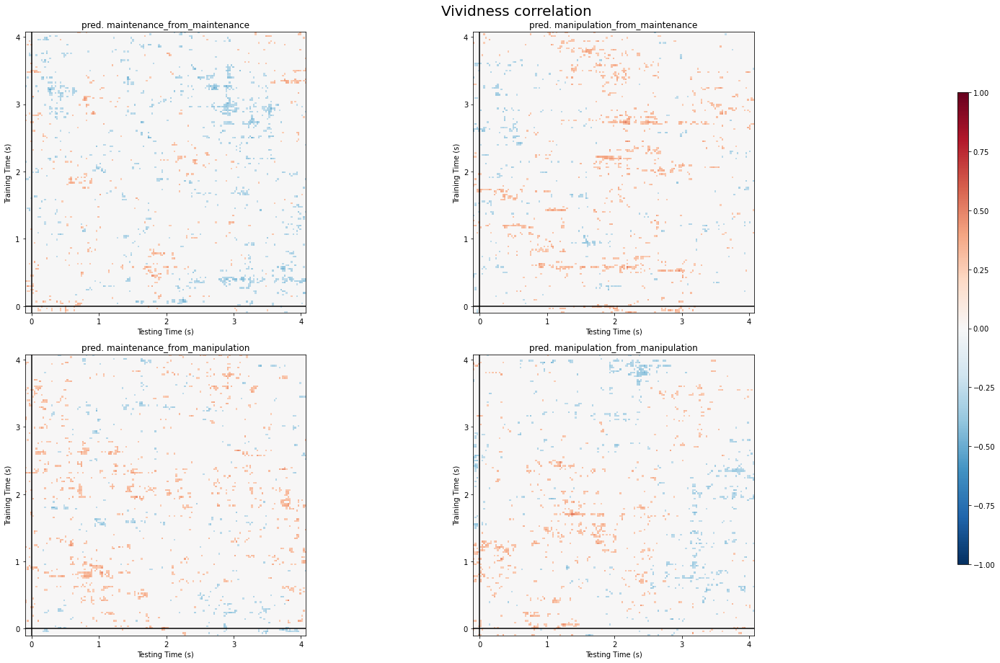

In [50]:
ncols = 2
fig, axes = plt.subplots(ncols=ncols,nrows=2, figsize = (20,13)) #,gridspec_kw=dict(width_ratios=[1,1,1,1]) )
for sidx,s in enumerate(cors):
    f,se = s.split('_from_')
    ext = [-.1,smean[s].shape[1] * .025,  
           -.1,smean[s].shape[0] * .025]
    rix, cix = sidx//ncols,sidx%ncols
    mask = pvals[s] <= .05
    im = axes[rix, cix].matshow(cors[s]*mask, vmin = -1, vmax = 1,#vmin=0.18, vmax=0.48,
                                      cmap='RdBu_r', origin='lower', extent=ext)
    axes[rix, cix].axhline(0., color='k')
    axes[rix, cix].axvline(0., color='k')
    axes[rix, cix].xaxis.set_ticks_position('bottom')
    axes[rix, cix].set_xlabel('Testing Time (s)')
    axes[rix, cix].set_ylabel('Training Time (s)')
    axes[rix, cix].set_anchor('W')
    axes[rix, cix].set_title('pred. {}'.format(s),{'horizontalalignment': 'center'})
cbar_ax = fig.add_axes([0.925,0.15,0.01,0.7])
fig.colorbar(im,cax=cbar_ax)
fig.suptitle('Vividness correlation', fontsize =  20)
plt.tight_layout()

In [ ]:
# #plot musicians and nonmusicians
# varnames = {'intercept': 0, 'vividness': 1, 'musicianship': 2}
# ncols = 2
# for ex in varnames:
#     fig, axes = plt.subplots(ncols=ncols,nrows=2, figsize = (20,13)) #,gridspec_kw=dict(width_ratios=[1,1,1,1]) )
#     for sidx,s in enumerate(betas):
#         f,se = s.split('_from_')
#         ext = [-.1,smean[s].shape[1] * .025,  
#                -.1,smean[s].shape[0] * .025]
#         rix, cix = sidx//ncols,sidx%ncols
#         mask = reg_pvals[s][varnames[ex]] < .025
#         im = axes[rix, cix].matshow(betas[s][varnames[ex]]*mask,# vmin = .4, vmax = .6,#vmin=0.18, vmax=0.48,
#                                           cmap='RdBu_r', origin='lower', extent=ext)
#         axes[rix, cix].axhline(0., color='k')
#         axes[rix, cix].axvline(0., color='k')
#         axes[rix, cix].xaxis.set_ticks_position('bottom')
#         axes[rix, cix].set_xlabel('Testing Time (s)')
#         axes[rix, cix].set_ylabel('Training Time (s)')
#         axes[rix, cix].set_anchor('W')
#         axes[rix, cix].set_title('pred. {}'.format(s),{'horizontalalignment': 'center'})
#     cbar_ax = fig.add_axes([0.925,0.15,0.01,0.7])
#     fig.colorbar(im,cax=cbar_ax)
#     fig.suptitle('Decoding accuracy (ROC - AUC) {}'.format(ex), fontsize =  20)
#     plt.tight_layout()
# #plt.savefig(avg_path + '/figures/{}_accuracies_imagined.pdf'.format(sub),orientation='landscape')


In [ ]:
# eix0 = np.array(dem['musicianship']) == 0
# eix1 = np.array(dem['musicianship']) == 1
# print(eix0)
# print(eix1)
# fig, axes = plt.subplots(ncols=ncols,nrows=4, figsize = (20,13)) #,gridspec_kw=dict(width_ratios=[1,1,1,1]) )
# for sidx,s in enumerate(sdata):
#     f,se = s.split('_from_')

#     ext = [-.25,smean[s].shape[1] * .025 - 0.25,  
#            -.25,smean[s].shape[0] * .025 - 0.25]
#     rix, cix = sidx//ncols,sidx%ncols
#     im = axes[rix, cix].matshow(sdata[s][eix1].mean(axis=0) - sdata[s][eix0].mean(axis=0), #vmin = .4, vmax = .6,#vmin=0.18, vmax=0.48,
#                                       cmap='RdBu_r', origin='lower', extent=ext)
#     axes[rix, cix].axhline(0., color='k')
#     axes[rix, cix].axvline(0., color='k')
#     axes[rix, cix].xaxis.set_ticks_position('bottom')
#     axes[rix, cix].set_xlabel('Testing Time (s)')
#     axes[rix, cix].set_ylabel('Training Time (s)')
#     axes[rix, cix].set_anchor('W')
#     axes[rix, cix].set_title('pred. {}'.format(s),{'horizontalalignment': 'center'})
# cbar_ax = fig.add_axes([0.925,0.15,0.01,0.7])
# fig.colorbar(im,cax=cbar_ax)
# fig.suptitle('Decoding accuracy (ROC - AUC) musicians - non-musicians', fontsize =  20)
# plt.tight_layout()